## Importing all the Libraries

In [1]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

## Preprocessing

In [2]:
df = pd.read_csv("./dataset/DM1_game_dataset_cleaned.csv")

df.columns

Index(['Name', 'YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers',
       'MfgPlaytime', 'MfgAgeRec', 'NumAlternates', 'NumExpansions',
       'NumImplementations', 'IsReimplementation', 'Kickstarted', 'Rating',
       'HasFamily', 'Category', 'Rank', 'EngagementLevel'],
      dtype='object')

Excluded columns due to high zero values: ['NumAlternates', 'NumExpansions', 'NumImplementations']
Log-transforming columns: ['YearPublished', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime']
Columns used for IQR-based row outlier detection: ['YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime', 'MfgAgeRec', 'EngagementLevel']


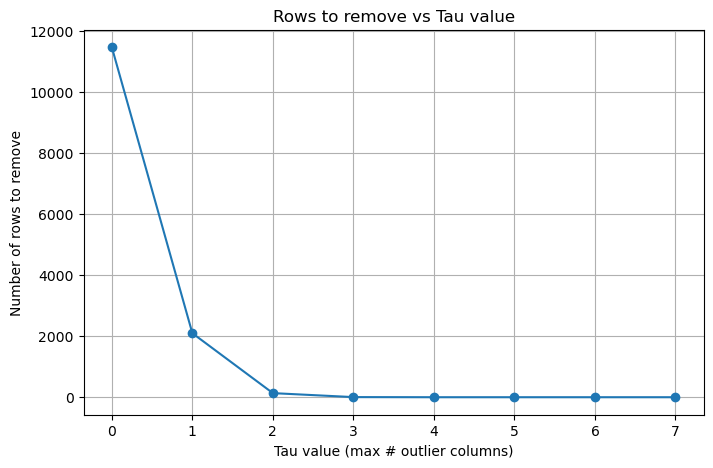

Chosen row-level outlier threshold (tau): 2
Number of rows to remove: 134
Shape after outlier removal: (21745, 7)


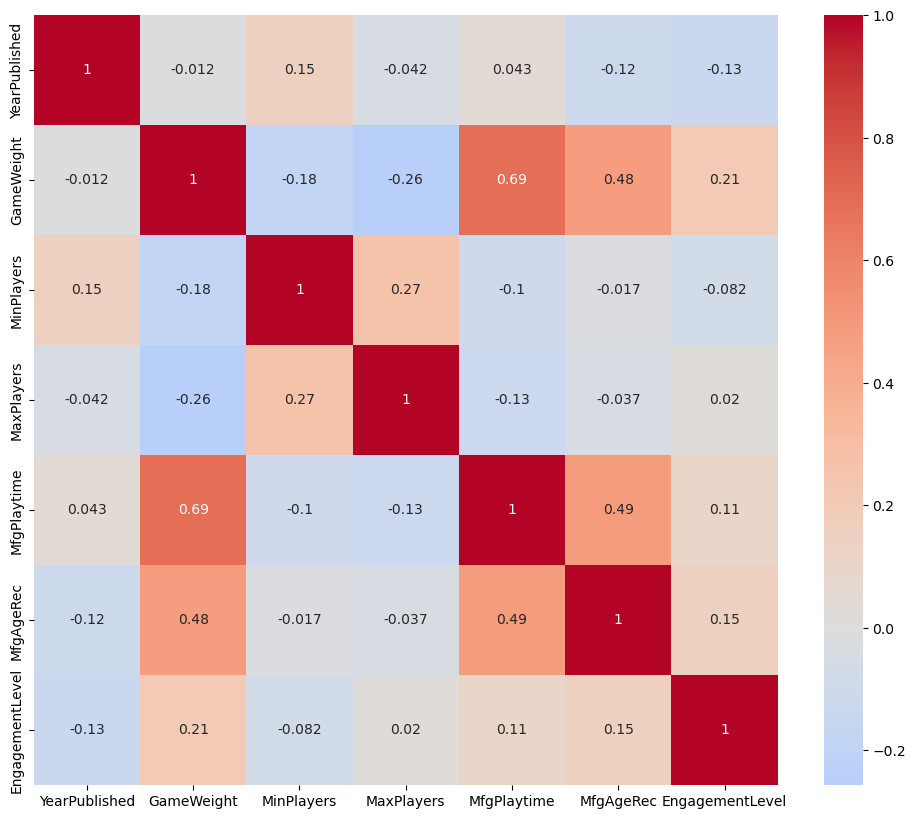

In [3]:
# 1. Select numeric columns
df_num = df.select_dtypes(include=["float64", "int64"])

# Remove binaries and Rank columns
numeric_cols = [col for col in df_num.columns 
                if df_num[col].nunique() > 2 and 'Rank' not in col]
df_num = df_num[numeric_cols].copy()

# 2. Fix YearPublished (recency)
if 'YearPublished' in df_num.columns:
    df_num['YearPublished'] = df_num['YearPublished'].max() - df_num['YearPublished']

# 3. Exclude columns with high zero values
zero_threshold = 0.5
cols_to_exclude = [col for col in df_num.columns 
                   if (df_num[col] == 0).mean() > zero_threshold]
df_num.drop(columns=cols_to_exclude, inplace=True)
print("Excluded columns due to high zero values:", cols_to_exclude)

# Log transform skewed columns except EngagementLevel
skewed_cols = df_num.skew().abs()
log_cols = skewed_cols[(skewed_cols >= 1.0) | (skewed_cols <= -1.0)].index.tolist()
log_cols = [c for c in log_cols if c != 'EngagementLevel']

df_num[log_cols] = df_num[log_cols].apply(np.log1p)
print("Log-transforming columns:", log_cols)

# 4. IQR-based row-level outlier detection on selected columns
cols_for_outliers = [
    'YearPublished', 'GameWeight', 'MinPlayers',
    'MaxPlayers', 'MfgPlaytime', 'MfgAgeRec', 'EngagementLevel'
]

# tieni solo quelle effettivamente presenti in df_num
cols_for_outliers = [c for c in cols_for_outliers if c in df_num.columns]
print("Columns used for IQR-based row outlier detection:", cols_for_outliers)

outlier_flags = pd.DataFrame(index=df_num.index)

for col in cols_for_outliers:
    q1 = df_num[col].quantile(0.25)
    q3 = df_num[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outlier_flags[col] = (
        (df_num[col] < lower_bound) | (df_num[col] > upper_bound)
    ).astype(int)

# Ri = numero di outlier per riga
Ri = outlier_flags.sum(axis=1)

# Plot: numero di righe eliminate al variare di tau
tau_values = np.arange(0, len(cols_for_outliers) + 1)
rows_to_drop_counts = [(Ri > tau).sum() for tau in tau_values]

plt.figure(figsize=(8, 5))
plt.plot(tau_values, rows_to_drop_counts, marker='o')
plt.xlabel('Tau value (max # outlier columns)')
plt.ylabel('Number of rows to remove')
plt.title('Rows to remove vs Tau value')
plt.grid(True)
plt.show()

# QUI scegli tu il tau intero, in base al grafico
tau = 2  # ad esempio: max 2 colonne outlier consentite
print(f"Chosen row-level outlier threshold (tau): {tau}")

rows_to_drop = Ri[Ri > tau].index
print(f"Number of rows to remove: {len(rows_to_drop)}")

# Rimuovi le righe outlier
df_filtered = df_num.drop(index=rows_to_drop).reset_index(drop=True)
print("Shape after outlier removal:", df_filtered.shape)

# 5. Standardize AFTER outlier removal
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_filtered)
X_filtered = X_scaled   # alias se ti serve lo stesso nome in altri pezzi di codice

# 6. Correlation Matrix
plt.figure(figsize=(12, 10))
sns.heatmap(df_filtered.corr(), cmap='coolwarm', center=0, annot=True)
plt.show()



In [99]:
#removing the same outliers from the original dataframe
df_cleaned = df.drop(index=rows_to_drop).reset_index(drop=True)
print("Shape of original dataframe after outlier removal:", df_cleaned.shape)


Shape of original dataframe after outlier removal: (21745, 17)


## Ward Linkage Method

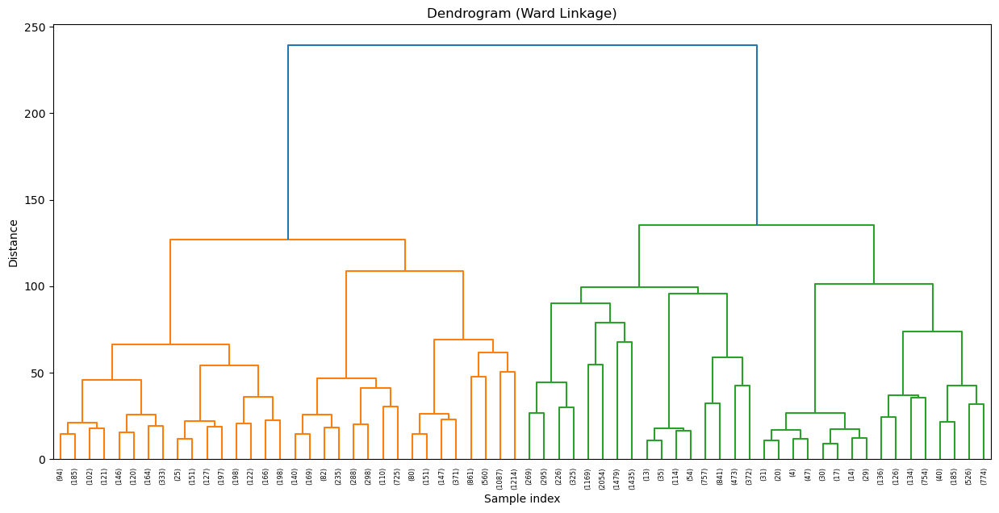

In [4]:
#creating the linkage matrix with Ward method
Z = linkage(X_filtered, method='ward')
# Plotting the dendrogram
plt.figure(figsize=(15, 7))
dendrogram(Z, truncate_mode='level', p=5)
plt.title('Dendrogram (Ward Linkage)')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()


Top 5 silhouette scores:

k = 2   ->  silhouette = 0.1799
k = 3   ->  silhouette = 0.1481
k = 4   ->  silhouette = 0.1396
k = 5   ->  silhouette = 0.1209
k = 6   ->  silhouette = 0.1178


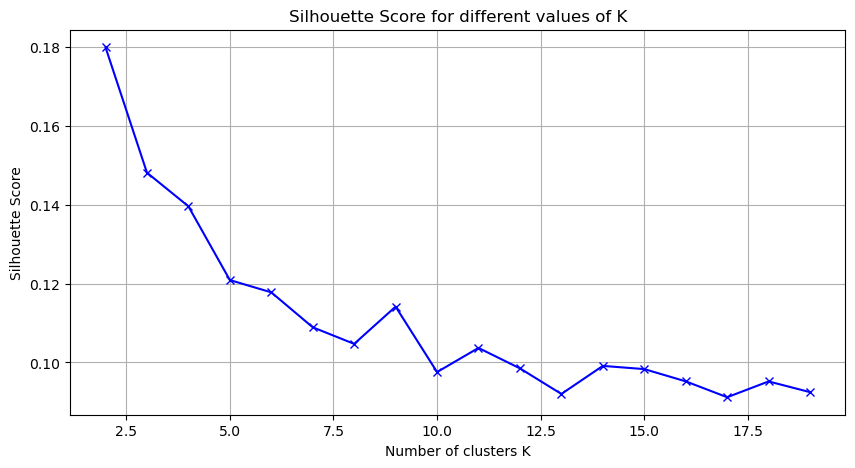

In [5]:
#analyzing the silhouette scores for different number of clusters
from sklearn.metrics import silhouette_score
silhouette_scores = []
K = range(2, 20)

for k in K:
    cluster_labels = fcluster(Z, k, criterion='maxclust')
    score = silhouette_score(X_filtered, cluster_labels)
    silhouette_scores.append((k, score))

# Ordina per silhouette decrescente
top5 = sorted(silhouette_scores, key=lambda x: x[1], reverse=True)[:5]

print("Top 5 silhouette scores:\n")
for k, score in top5:
    print(f"k = {k:<2d}  ->  silhouette = {score:.4f}")

# Plot completo
plt.figure(figsize=(10, 5))
plt.plot([k for k, s in silhouette_scores], 
         [s for k, s in silhouette_scores], 
         'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K')
plt.grid(True)
plt.show()



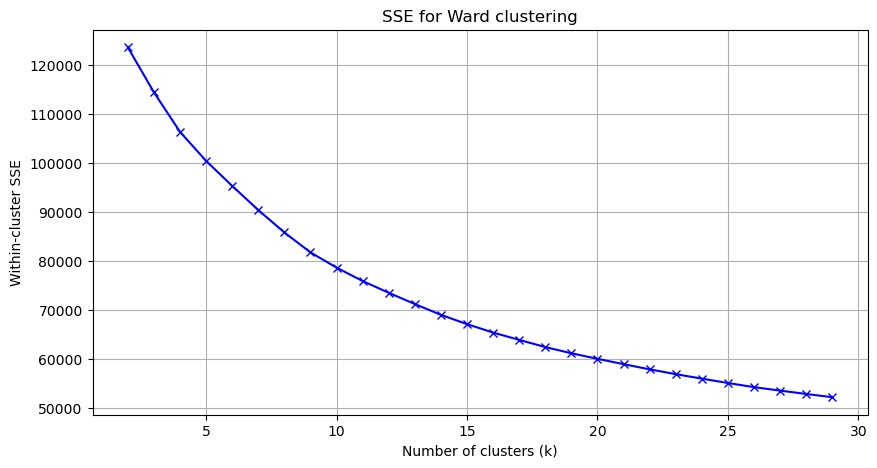

In [6]:
#SSE analysis for different number of clusters
import numpy as np
from scipy.cluster.hierarchy import fcluster

def compute_sse(X, labels):
    sse = 0
    for cluster_id in np.unique(labels):
        cluster_points = X[labels == cluster_id]
        centroid = cluster_points.mean(axis=0)
        sse += ((cluster_points - centroid)**2).sum()
    return sse

K = range(2, 30)
sse_values = []

for k in K:
    labels = fcluster(Z, k, criterion='maxclust')
    sse = compute_sse(X_filtered, labels)
    sse_values.append(sse)

plt.figure(figsize=(10, 5))
plt.plot(K, sse_values, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within-cluster SSE')
plt.title('SSE for Ward clustering')
plt.grid(True)
plt.show()


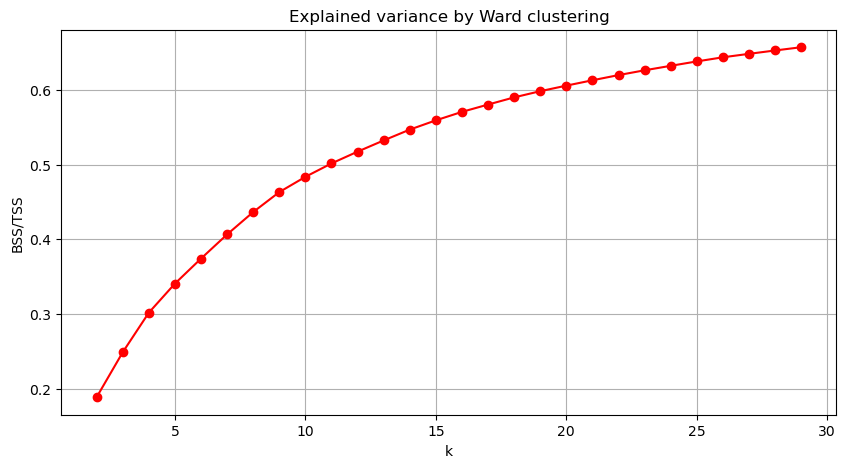

In [7]:
#analyzing BSS/TSS (BETWEEN/ TOTAL SUM OF SQUARES) for different number of clusters
global_mean = X_filtered.mean(axis=0)
TSS = ((X_filtered - global_mean)**2).sum()

bss_values = [TSS - sse for sse in sse_values]

plt.figure(figsize=(10,5))
plt.plot(K, [b/TSS for b in bss_values], 'ro-')
plt.xlabel("k")
plt.ylabel("BSS/TSS")
plt.title("Explained variance by Ward clustering")
plt.grid(True)
plt.show()


In [8]:
import pandas as pd
from scipy.cluster.hierarchy import fcluster

# Binary variables from df (original dataset)
binary_vars = ['IsReimplementation', 'Kickstarted', 'HasFamily']

# Numerical variables to summarize (those used in clustering)
num_vars = df_filtered.columns.tolist()

def summarize_clusters_full(Z, k, df_filtered, df_original):
    # 1. Compute cluster assignments
    labels = fcluster(Z, k, criterion='maxclust')

    # 2. Attach cluster labels to BOTH dataframes
    df_f = df_filtered.copy()
    df_f['cluster'] = labels

    df_o = df_original.copy()
    df_o['cluster'] = labels  # same labels!

    # 3. Numerical summary (from df_filtered)
    numerical_summary = df_f.groupby('cluster')[num_vars].mean()

    # 4. Binary summary (from original df)
    binary_summary = df_o.groupby('cluster')[binary_vars].mean() * 100

    # 5. Cluster sizes
    sizes = df_f['cluster'].value_counts().sort_index()

    return numerical_summary, binary_summary, sizes


# Generate results for k = 3, 4, 5
results = {}
for k in [3, 4, 5]:
    num_s, bin_s, sizes = summarize_clusters_full(Z, k, df_filtered, df_cleaned)
    results[k] = {
        "numerical": num_s,
        "binary": bin_s,
        "sizes": sizes
    }


# Print results
for k in results:
    print(f"\n===== RESULTS FOR k = {k} =====\n")
    print("Cluster sizes:\n", results[k]["sizes"], "\n")
    print("Numerical variables (means):\n", results[k]["numerical"], "\n")
    print("Binary variables (% incidence):\n", results[k]["binary"], "\n")


NameError: name 'df_cleaned' is not defined

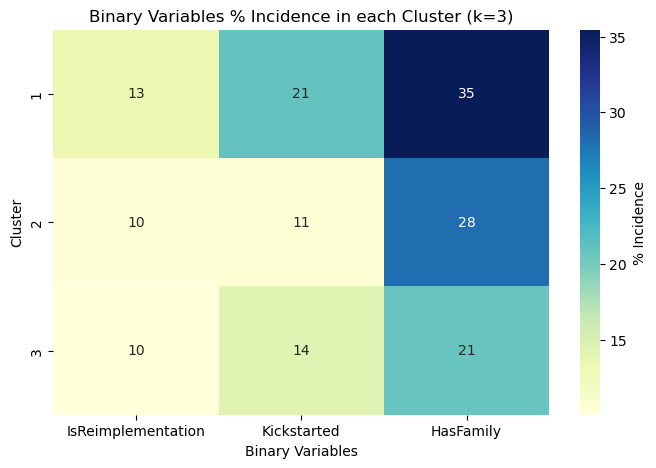

In [105]:
#heatmap for binary variables % in each cluster (k=3)
k = 3
binary_summary = results[k]["binary"]
plt.figure(figsize=(8, 5))
sns.heatmap(binary_summary, annot=True, cmap='YlGnBu', cbar_kws={'label': '% Incidence'})
plt.title(f'Binary Variables % Incidence in each Cluster (k={k})')
plt.xlabel('Binary Variables')
plt.ylabel('Cluster')
plt.show()

In [106]:
#creating clusters for the best k
best_k = 3  # assuming 2 is the best k from silhouette analysis
cluster_labels = fcluster(Z, best_k, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels
print(df_filtered['Cluster'].value_counts())

Cluster
2    9911
1    8967
3    2867
Name: count, dtype: int64


In [107]:
#analyzing clusters respect to categories distribution 
category_pct = (
    pd.crosstab(
        df_filtered['Cluster'],
        df_cleaned['Category'],   # Category presa dal df originale
        normalize='index'                           
    )*100
).round(2)
category_pct





Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
1,1.97,1.72,0.04,5.78,34.01,0.55,14.92,9.14,31.86
2,8.90,1.42,8.36,11.91,57.56,3.82,1.76,2.37,3.89
3,0.59,0.21,1.53,4.05,83.68,6.63,0.98,1.19,1.15


<Figure size 1200x500 with 0 Axes>

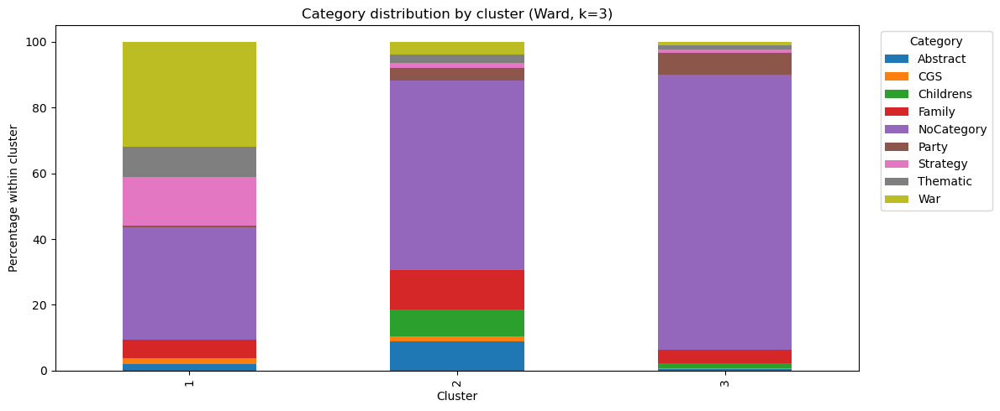

In [108]:
#creating histograms for catggory distribution in each cluster
plot_df = category_pct.copy()

plt.figure(figsize=(12, 5))
plot_df.plot(kind='bar', stacked=True, figsize=(12, 5))

plt.ylabel('Percentage within cluster')
plt.xlabel('Cluster')
plt.title('Category distribution by cluster (Ward, k=3)')
plt.legend(title='Category', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

<Figure size 1200x500 with 0 Axes>

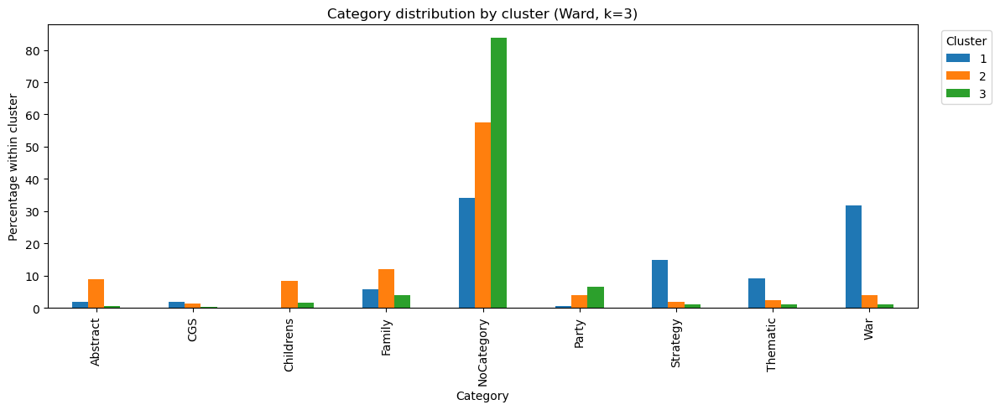

In [109]:
#alternative
plot_df = category_pct.T  

plt.figure(figsize=(12, 5))
plot_df.plot(kind='bar', figsize=(12, 5))

plt.ylabel('Percentage within cluster')
plt.xlabel('Category')
plt.title('Category distribution by cluster (Ward, k=3)')
plt.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

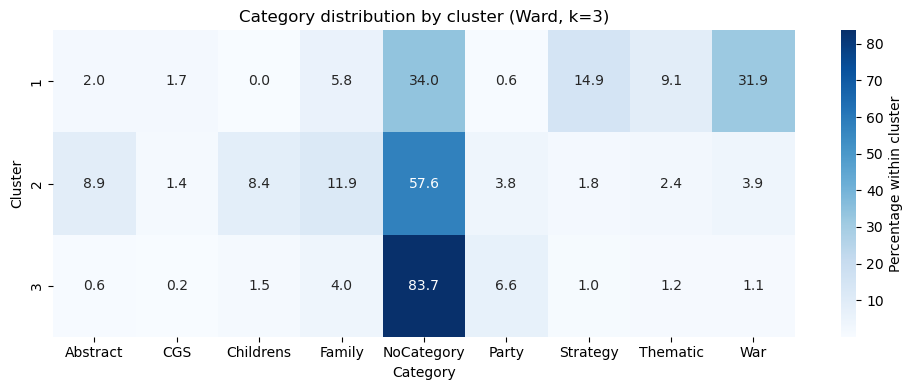

In [110]:
#alternative 2 with heatmap
plt.figure(figsize=(10, 4))
sns.heatmap(
    category_pct,
    annot=True,
    fmt=".1f",
    cmap='Blues',
    cbar_kws={'label': 'Percentage within cluster'}
)
plt.xlabel('Category')
plt.ylabel('Cluster')
plt.title('Category distribution by cluster (Ward, k=3)')
plt.tight_layout()
plt.show()


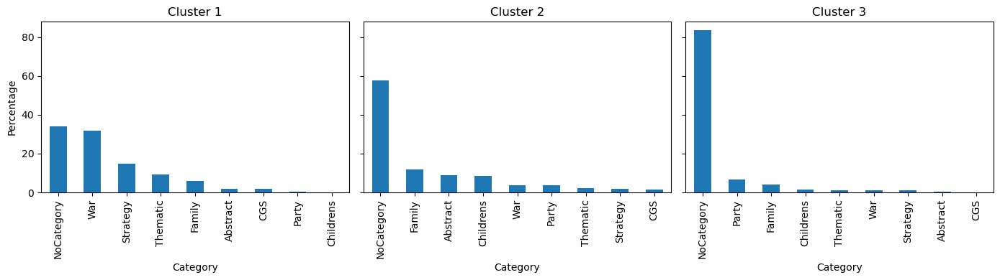

In [111]:
#ålternative 3
fig, axes = plt.subplots(1, 3, figsize=(14, 4), sharey=True)

for i, ax in enumerate(axes, start=1):
    category_pct.loc[i].sort_values(ascending=False).plot(
        kind='bar', ax=ax
    )
    ax.set_title(f'Cluster {i}')
    ax.set_ylabel('Percentage')

plt.tight_layout()
plt.show()


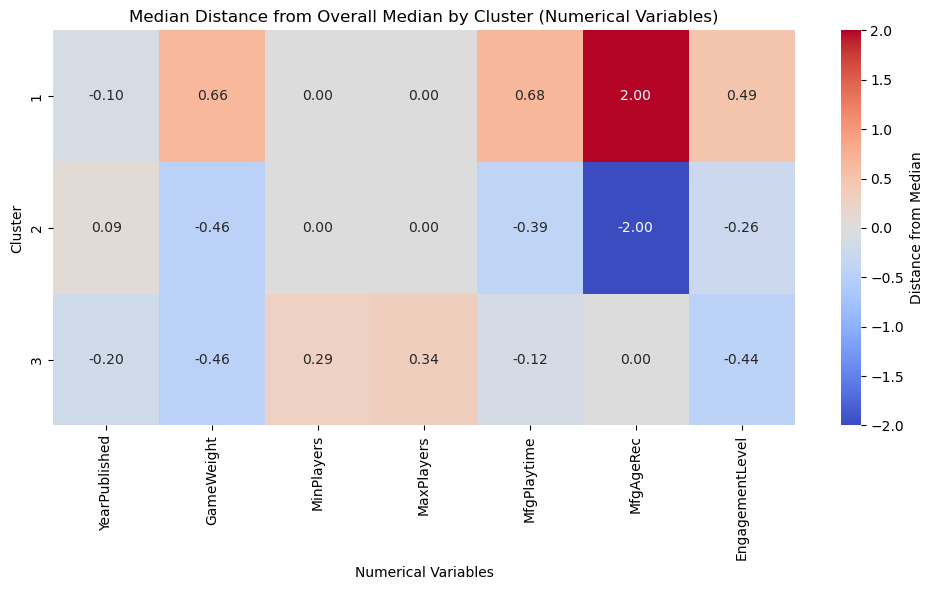

In [112]:
#heatmap with dist from median for each cluster for numerical variables
import numpy as np
median_values = df_filtered[num_vars].median()
dist_from_median = df_filtered[num_vars] - median_values
dist_from_median['Cluster'] = df_filtered['Cluster']
cluster_medians = dist_from_median.groupby('Cluster').median()
plt.figure(figsize=(10, 6))
sns.heatmap(
    cluster_medians,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    center=0,
    cbar_kws={'label': 'Distance from Median'}
)
plt.title('Median Distance from Overall Median by Cluster (Numerical Variables)')
plt.xlabel('Numerical Variables')
plt.ylabel('Cluster')
plt.tight_layout()
plt.show()








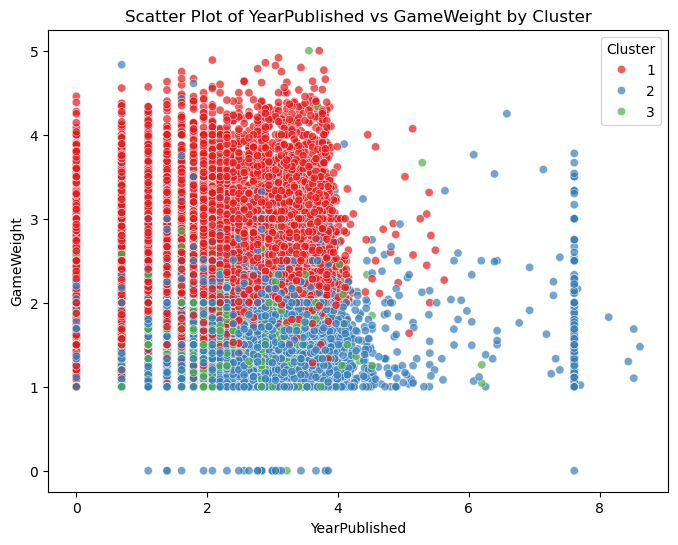

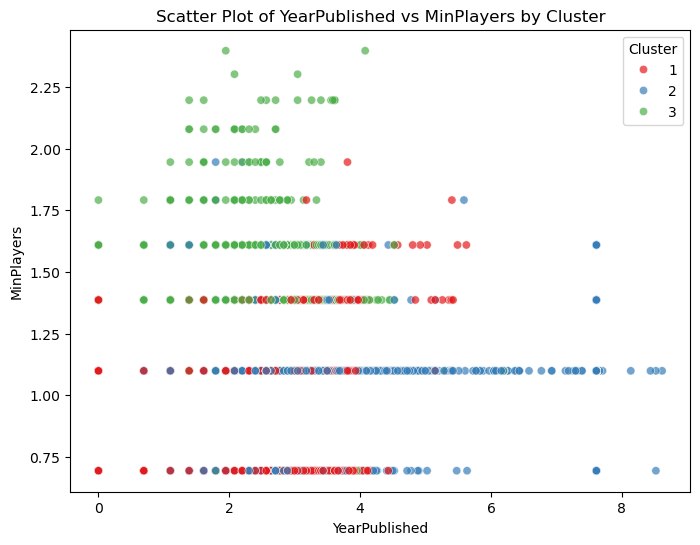

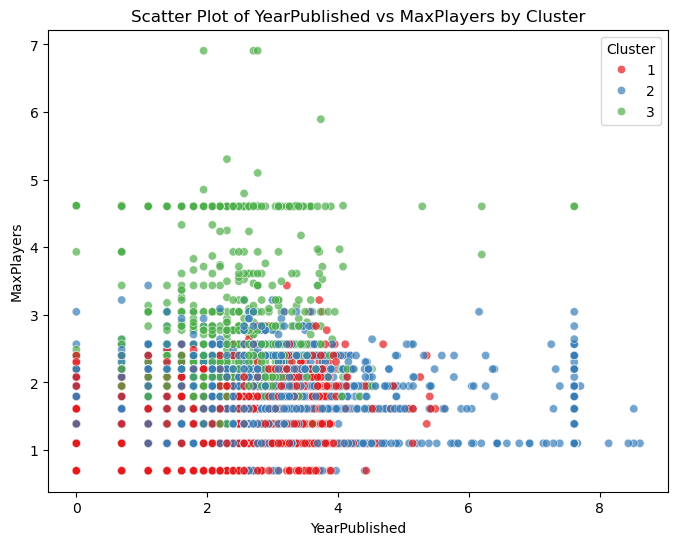

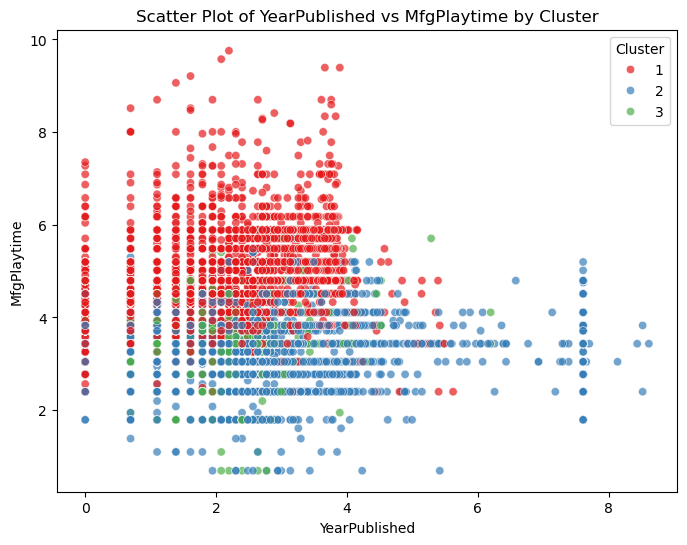

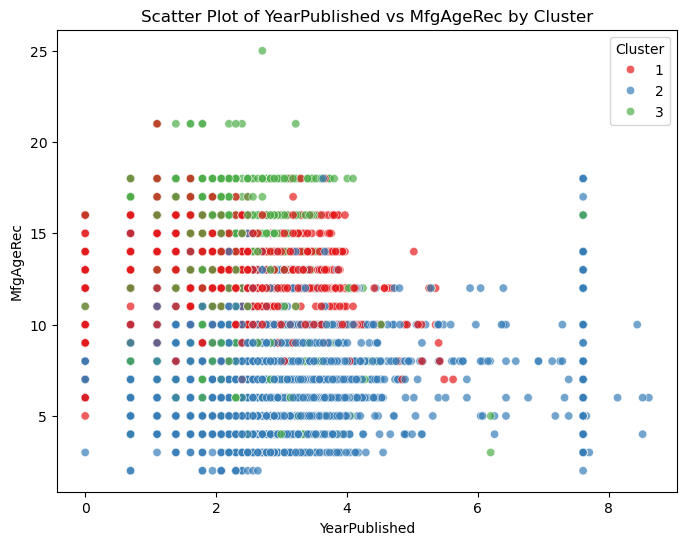

...

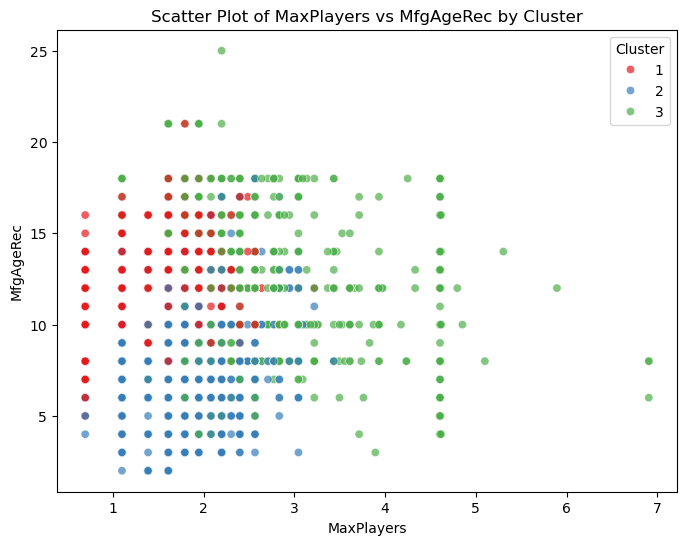

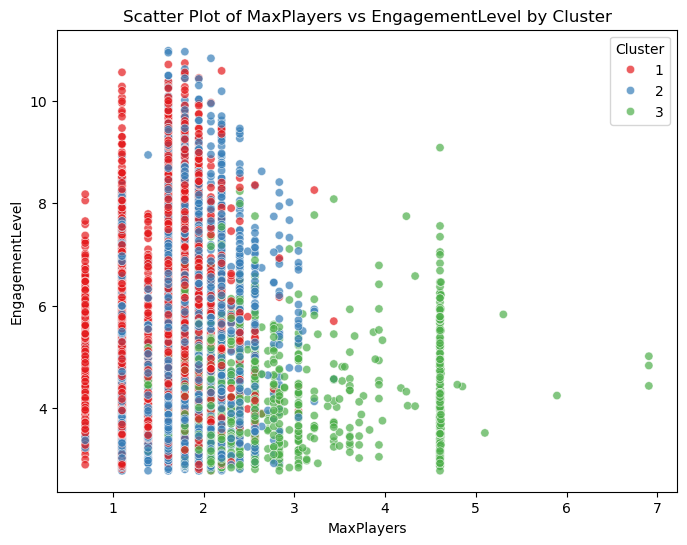

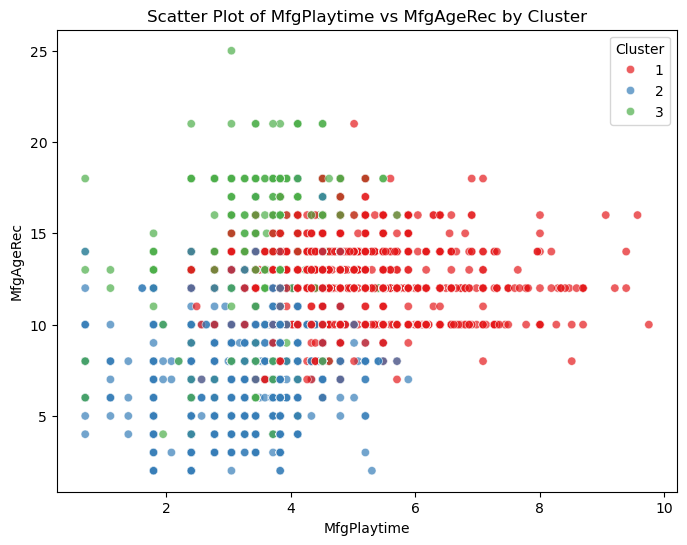

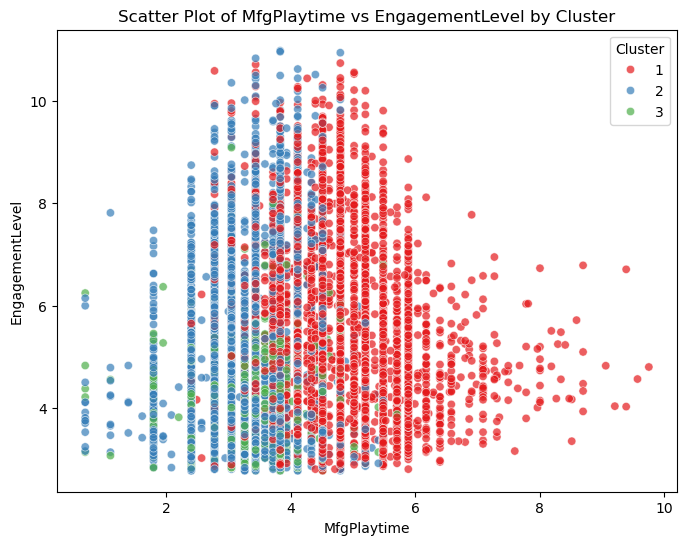

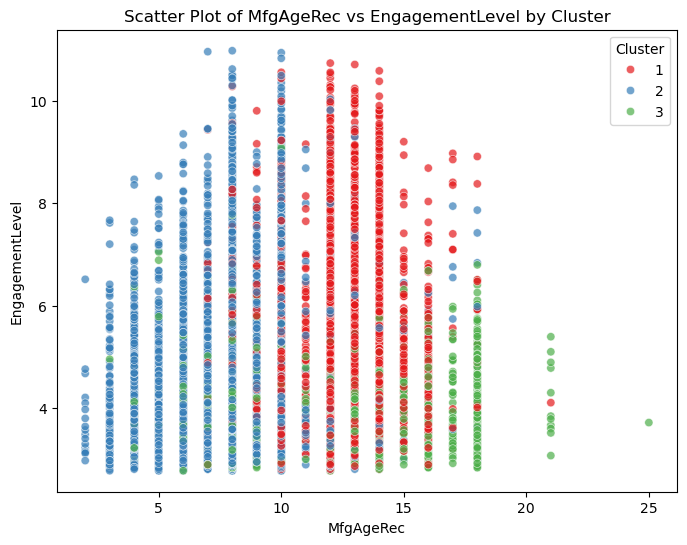

In [113]:
#generating scatter plots for each pair of features colored by cluster
import itertools
feature_pairs = list(itertools.combinations(df_filtered.columns[:-1], 2))  # exclude 'Cluster' column
for (feat_x, feat_y) in feature_pairs:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=df_filtered, 
        x=feat_x, 
        y=feat_y, 
        hue='Cluster', 
        palette='Set1', 
        alpha=0.7
    )
    plt.title(f'Scatter Plot of {feat_x} vs {feat_y} by Cluster')
    plt.legend(title='Cluster')
    plt.show()


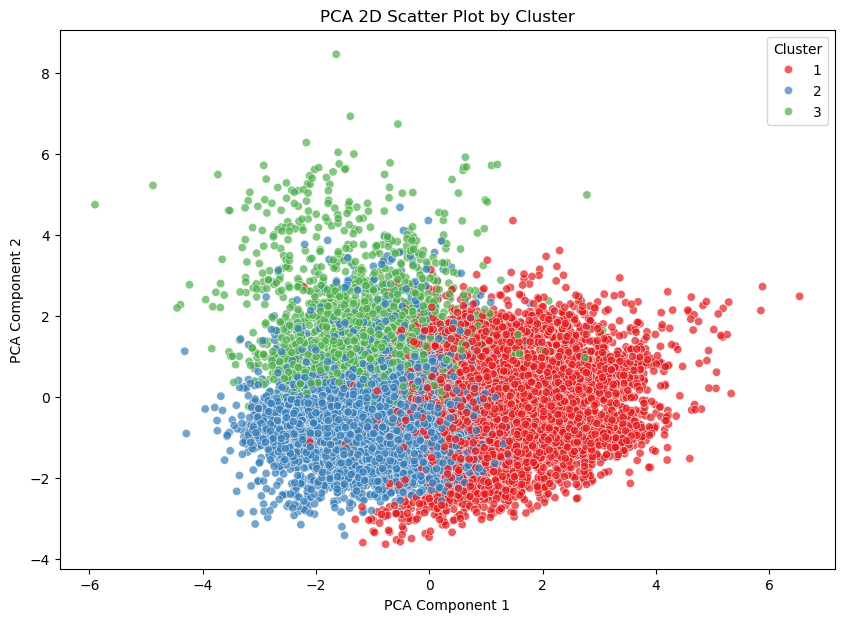

In [114]:
#PCA analysis for cluster visualization
from sklearn.decomposition import PCA
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_filtered)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d[:, 0], 
    y=X_pca_2d[:, 1], 
    hue=df_filtered['Cluster'], 
    palette='Set1', 
    alpha=0.7
)
plt.title('PCA 2D Scatter Plot by Cluster')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

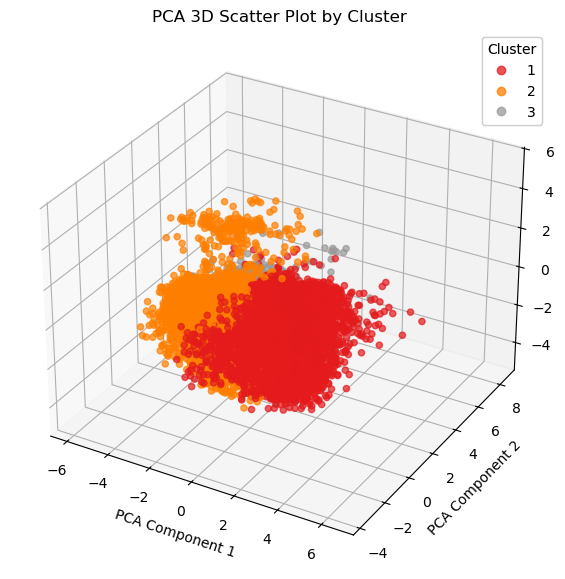

In [115]:
#pca with 3 components
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_filtered)
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    X_pca_3d[:, 0], 
    X_pca_3d[:, 1], 
    X_pca_3d[:, 2], 
    c=df_filtered['Cluster'], 
    cmap='Set1', 
    alpha=0.7
)
ax.set_title('PCA 3D Scatter Plot by Cluster')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
legend1 = ax.legend(*scatter.legend_elements(), title="Cluster")
ax.add_artist(legend1)
plt.show()  

In [136]:
#analyzing clusters with Ward with k = 9 
best_k = 9  # assuming 2 is the best k from silhouette analysis
cluster_labels = fcluster(Z, best_k, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels
print(df_filtered['Cluster'].value_counts())


Cluster
5    6137
3    4471
9    2675
1    2449
7    2443
2    2047
4    1115
6     216
8     192
Name: count, dtype: int64


## Complete Linkage Method

In [116]:
#removing other outliers before applying complete linkage
import numpy as np

centroid = X_scaled.mean(axis=0)
distances = np.linalg.norm(X_scaled - centroid, axis=1)

trim_percentile = 98  # 98 = rimuove top 2%, 99 = top 1%
threshold = np.percentile(distances, trim_percentile)

mask_keep = distances <= threshold

X_scaled_trimmed = X_scaled[mask_keep]
df_trimmed = df_filtered.loc[mask_keep].copy()

print(f"Osservazioni iniziali: {X_scaled.shape[0]}")
print(f"Osservazioni rimosse: {np.sum(~mask_keep)}")
print(f"Osservazioni finali: {X_scaled_trimmed.shape[0]}")




Osservazioni iniziali: 21745
Osservazioni rimosse: 435
Osservazioni finali: 21310


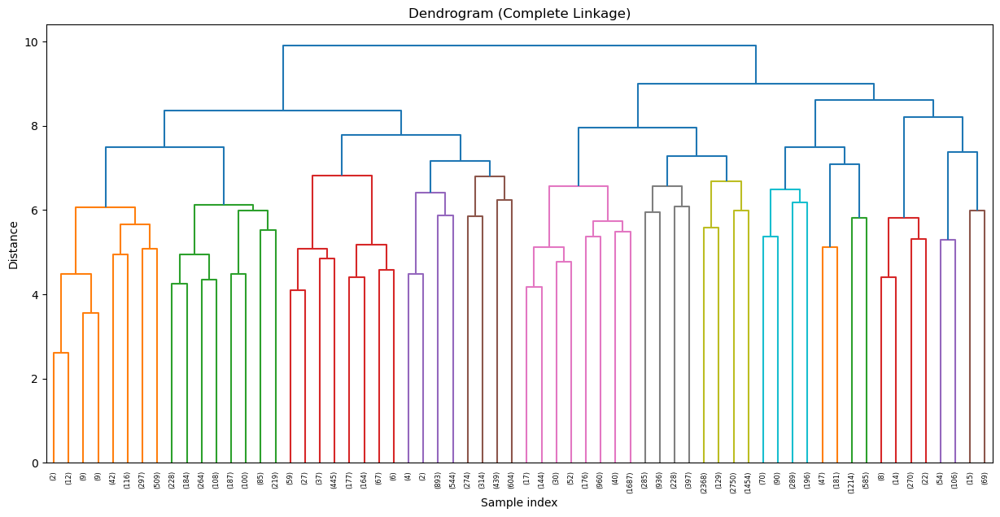

In [117]:
#creating dendrogram with complete linkagem, considering trimmed data
Z_complete = linkage(X_scaled_trimmed, method='complete', metric='euclidean')

plt.figure(figsize=(15, 7))
dendrogram(Z_complete, truncate_mode='level', p=5)
plt.title('Dendrogram (Complete Linkage)')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()


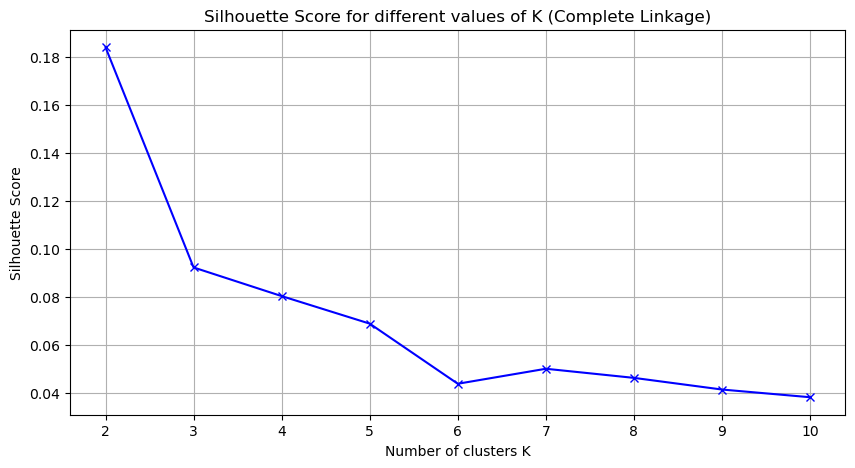

In [118]:
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import fcluster

silhouette_scores_complete = []
K_complete = range(2, 11)

for k in K_complete:
    labels = fcluster(Z_complete, k, criterion='maxclust')
    score = silhouette_score(X_scaled_trimmed, labels)
    silhouette_scores_complete.append((k, score))

plt.figure(figsize=(10, 5))
plt.plot([k for k, s in silhouette_scores_complete],
         [s for k, s in silhouette_scores_complete], 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Complete Linkage)')
plt.grid(True)
plt.show()

In [119]:
#assigning clusters for complete linkage 
best_k_complete = 2  # assuming 2 is the best k from silhouette analysis
cluster_labels_complete = fcluster(Z_complete, best_k_complete, criterion='maxclust')
df_trimmed['Cluster'] = cluster_labels_complete
print(df_trimmed['Cluster'].value_counts())      

Cluster
2    14883
1     6427
Name: count, dtype: int64


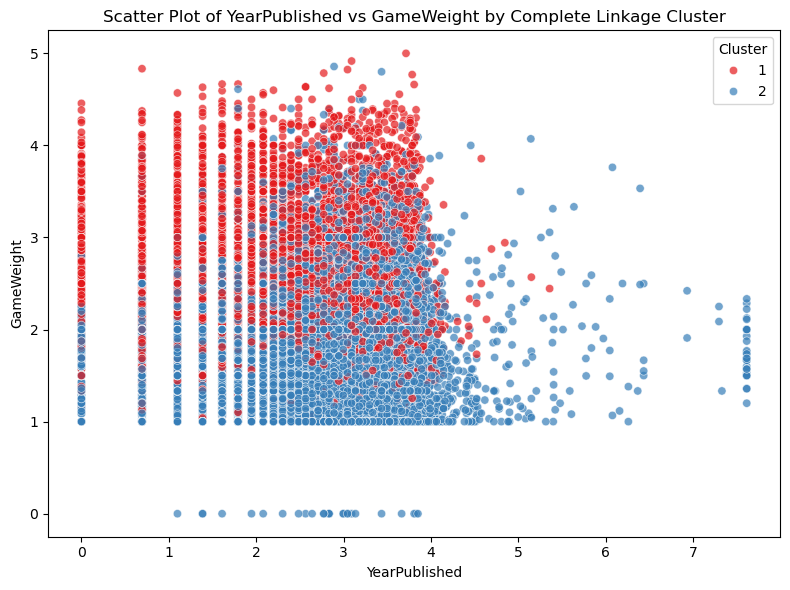

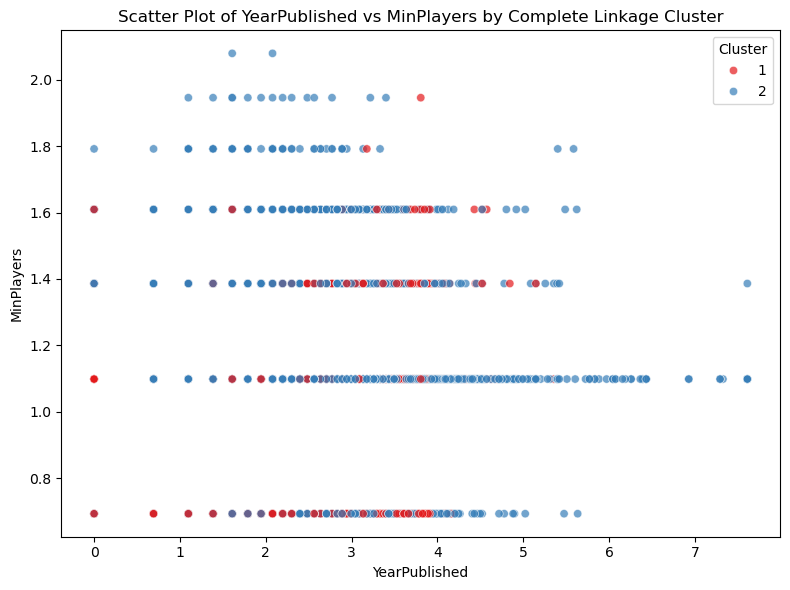

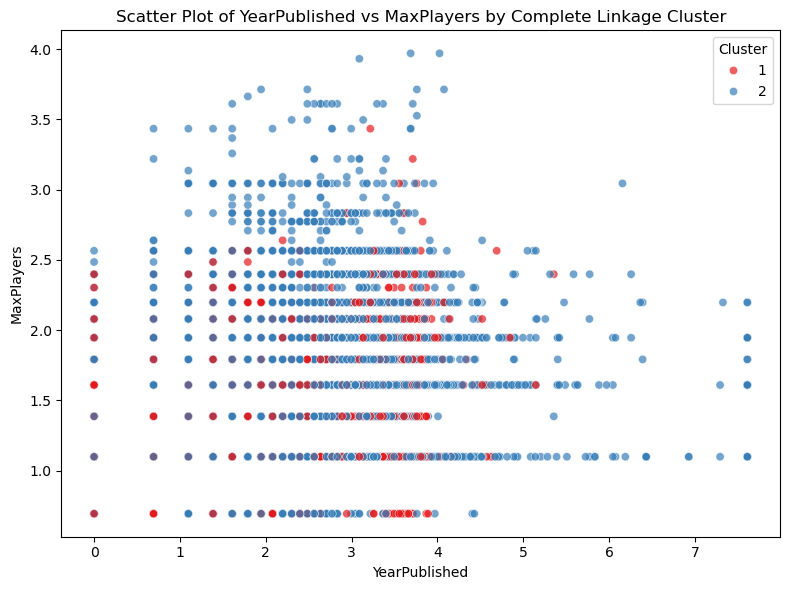

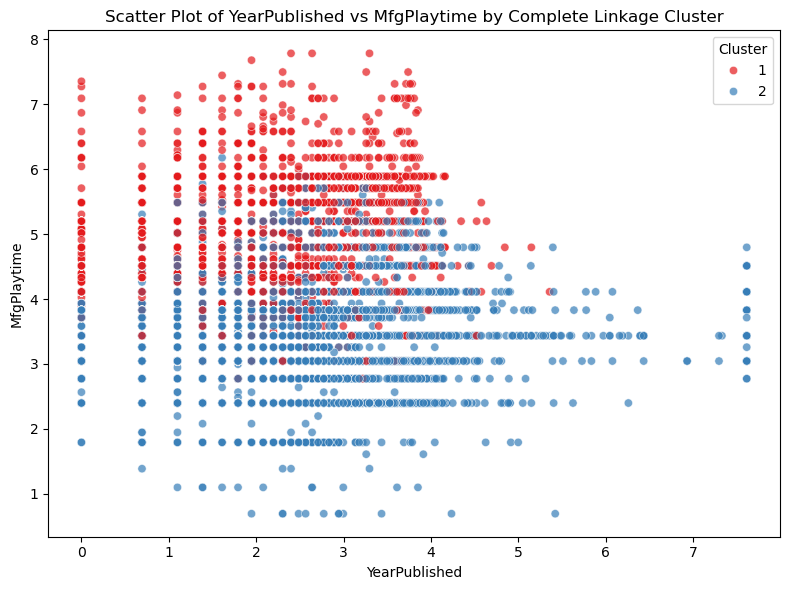

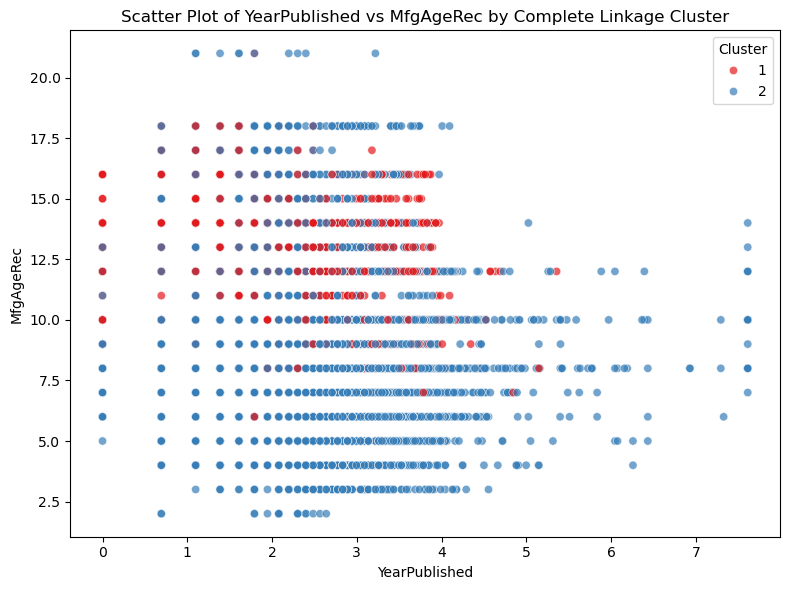

...

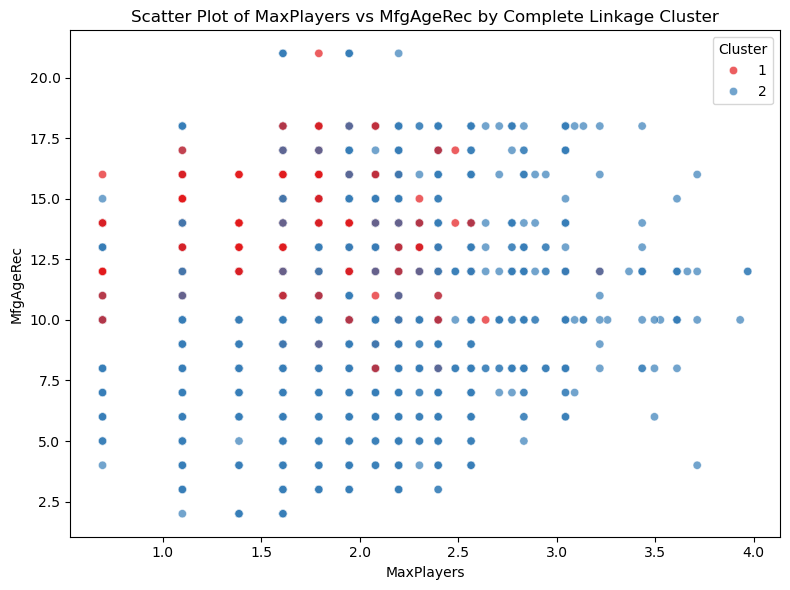

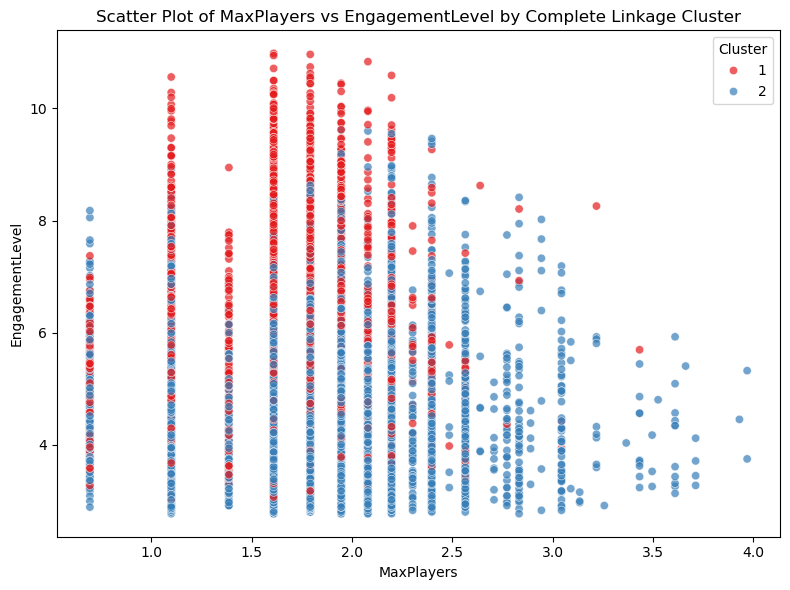

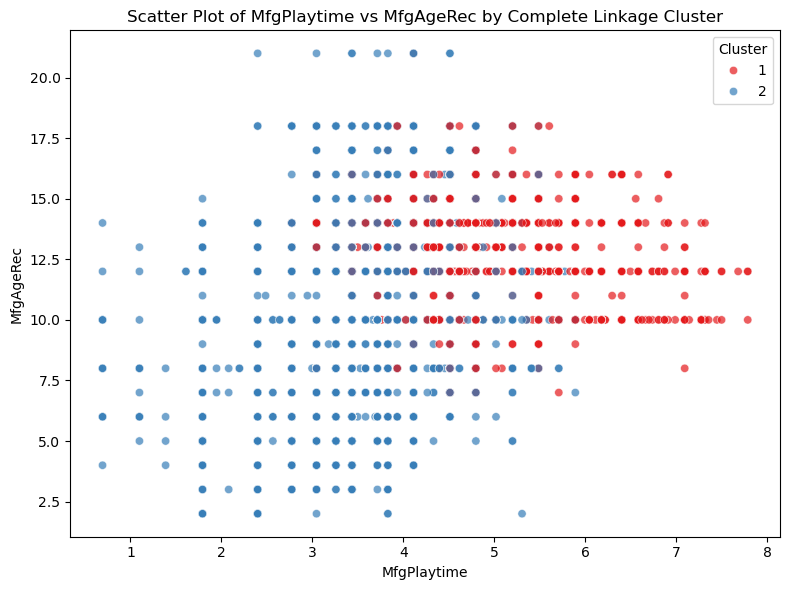

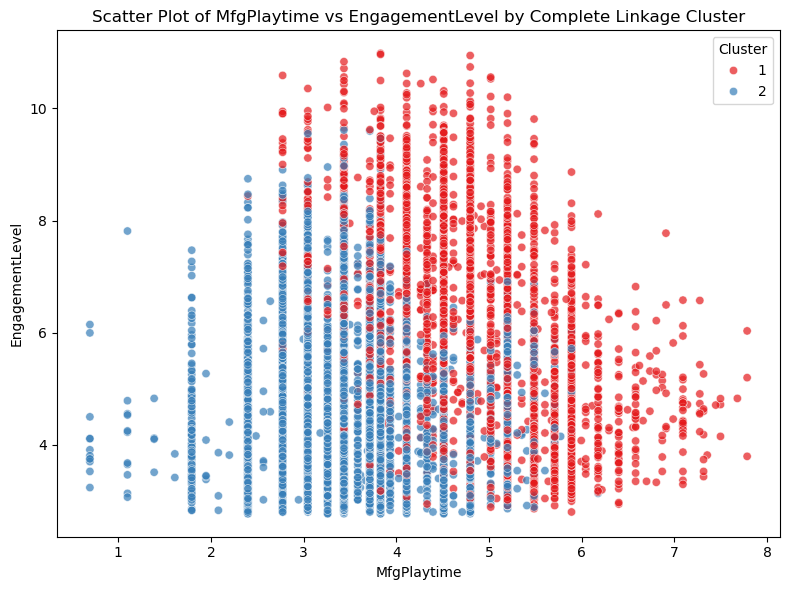

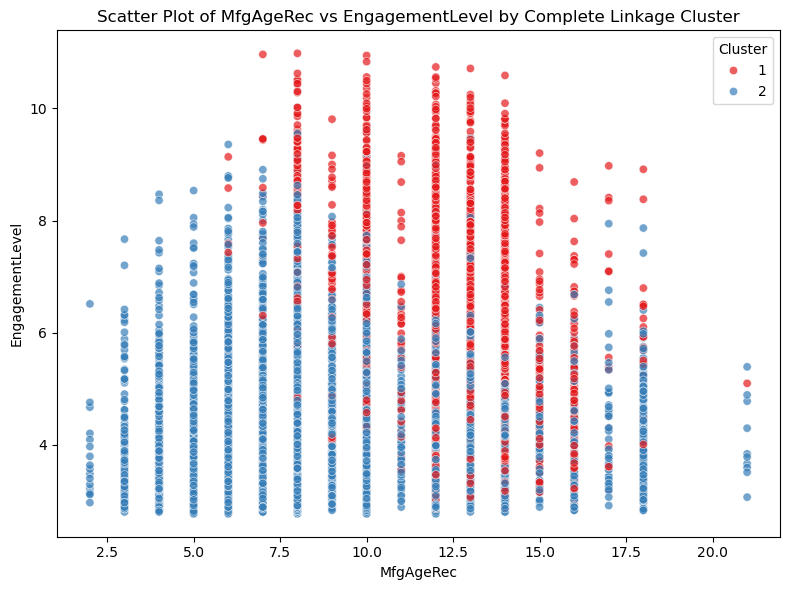

In [120]:
#plotting scatter plots for complete linkage clusters for each pair of features in the trimmed dataset
feature_cols = [col for col in df_trimmed.columns if col != "Cluster"]

for i in range(len(feature_cols)):
    for j in range(i + 1, len(feature_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(
            data=df_trimmed,
            x=feature_cols[i],
            y=feature_cols[j],
            hue="Cluster",
            palette="Set1",
            alpha=0.7
        )
        plt.title(f"Scatter Plot of {feature_cols[i]} vs {feature_cols[j]} by Complete Linkage Cluster")
        plt.legend(title="Cluster")
        plt.tight_layout()
        plt.show()


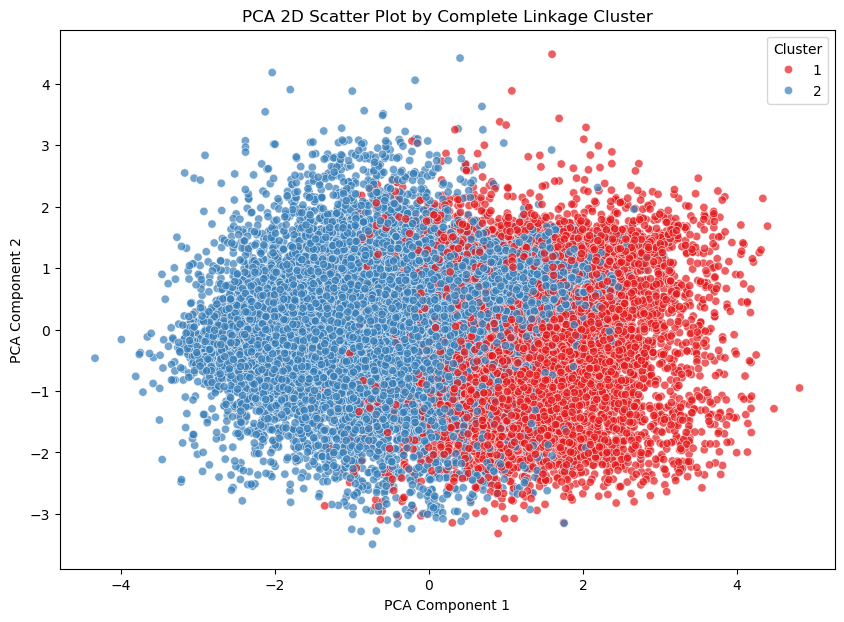

In [121]:
#pca analysis for complete linkage clusters
#importing PCA from sklearn
from sklearn.decomposition import PCA
pca_2d_complete = PCA(n_components=2)
X_pca_2d_complete = pca_2d_complete.fit_transform(X_scaled_trimmed)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d_complete[:, 0],
    y=X_pca_2d_complete[:, 1],
    hue=df_trimmed['Cluster'],
    palette='Set1',
    alpha=0.7
)
plt.title('PCA 2D Scatter Plot by Complete Linkage Cluster')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()


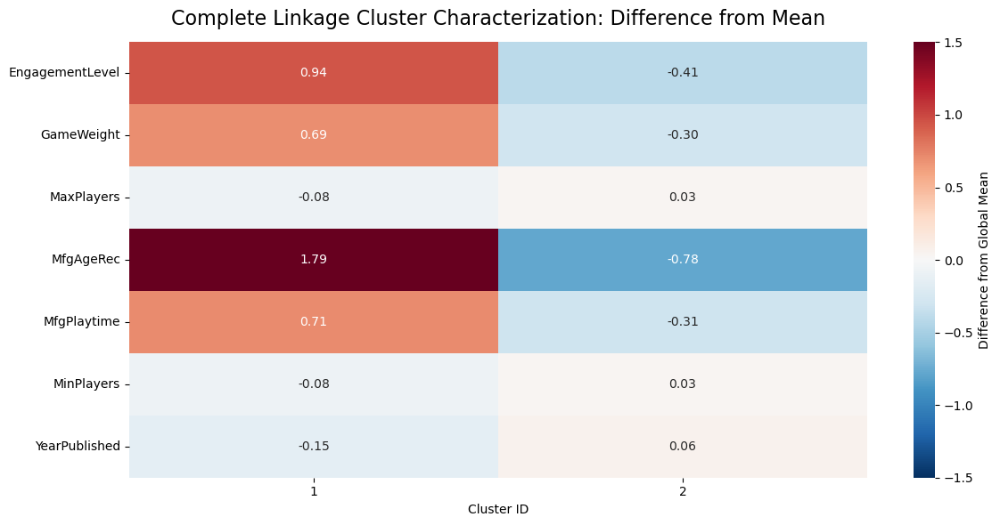

In [122]:
#analysis of the difference between cluster means and overall mean for complete linkage clusters
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  
# 1. Variabili numeriche da includere
num_vars = ['EngagementLevel', 'GameWeight', 'MaxPlayers',
            'MfgAgeRec', 'MfgPlaytime', 'MinPlayers', 'YearPublished'] 
# 2. Medie per cluster e media globale (come nel tuo codice originale)
cluster_means_complete = df_trimmed.groupby('Cluster')[num_vars].mean()
overall_mean_complete  = df_trimmed[num_vars].mean() 
# 3. Differenza dalla media globale (NON normalizzata)
dist_from_overall_complete = cluster_means_complete - overall_mean_complete
# 4. Trasponi per avere variabili sulle righe e cluster sulle colonne
dist_plot_complete = dist_from_overall_complete.T
# 5. Heatmap con estetica "figa"
plt.figure(figsize=(12, 6))
ax = sns.heatmap(
    dist_plot_complete,
    annot=True,
    fmt=".2f",
    cmap='RdBu_r',          # diverging red–white–blue
    center=0,
    vmin=-1.5,              # adatta se vuoi più/meno contrasto
    vmax= 1.5,
    cbar_kws={'label': 'Difference from Global Mean'}
)
plt.title("Complete Linkage Cluster Characterization: Difference from Mean", fontsize=16, pad=14)
plt.xlabel("Cluster ID")
plt.ylabel("")
plt.tight_layout()
plt.show()

In [123]:
#before analyzing binary variables, we need to remove the same outliers from the original dataframe
df_bin_cat_trimmed = df_cleaned.loc[df_trimmed.index].copy()
df_bin_cat_trimmed["Cluster"] = df_trimmed["Cluster"]


In [124]:
#analysis of binary variables % incidence in each cluster for complete linkage
binary_cols = ["HasFamily", "IsReimplementation", "Kickstarted"]

bin_summary = (
    df_bin_cat_trimmed
    .groupby("Cluster")[binary_cols]
    .mean()
    .mul(100)
    .round(2)
)

print("Percentuale di TRUE per cluster (%):")
display(bin_summary)


Percentuale di TRUE per cluster (%):


,HasFamily,IsReimplementation,Kickstarted
Cluster,,,
1,40.30,14.55,22.64
2,25.62,10.25,12.34


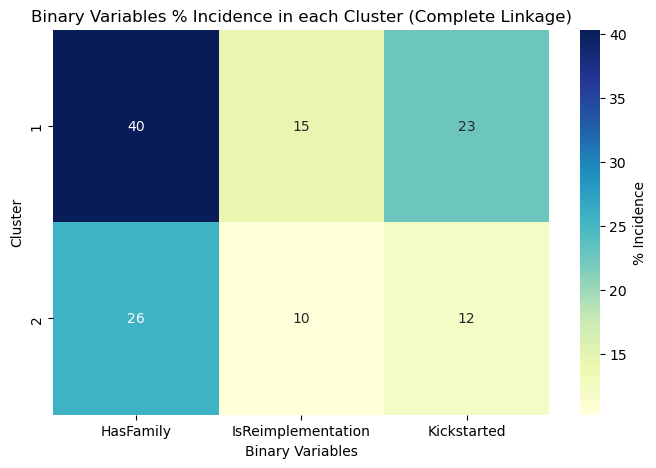

In [125]:
#creating a heatmap for binary variables % incidence in each cluster for complete linkage
plt.figure(figsize=(8, 5))
sns.heatmap(
    bin_summary,
    annot=True,
    cmap='YlGnBu',
    cbar_kws={'label': '% Incidence'}
)
plt.title('Binary Variables % Incidence in each Cluster (Complete Linkage)')
plt.xlabel('Binary Variables')
plt.ylabel('Cluster')
plt.show()

In [126]:
#analysis for category distribution in each complete linkage cluster
category_pct_complete = (
    pd.crosstab(
        df_bin_cat_trimmed['Cluster'],
        df_bin_cat_trimmed['Category'],
        normalize='index'
    )*100
).round(2)
category_pct_complete 

Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
1,1.84,1.90,0.14,9.04,27.20,1.20,19.45,11.39,27.85
2,6.26,1.19,5.71,8.21,61.35,3.37,1.94,2.37,9.60


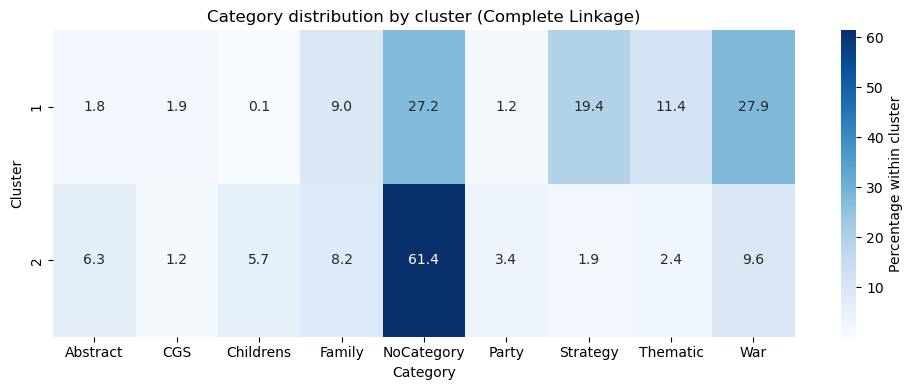

In [127]:
#creating a heatmap for category distribution in each complete linkage cluster
plt.figure(figsize=(10, 4))
sns.heatmap(
    category_pct_complete,
    annot=True,
    fmt=".1f",
    cmap='Blues',
    cbar_kws={'label': 'Percentage within cluster'}
)
plt.xlabel('Category')
plt.ylabel('Cluster')
plt.title('Category distribution by cluster (Complete Linkage)')
plt.tight_layout()
plt.show()

## Single Linkage

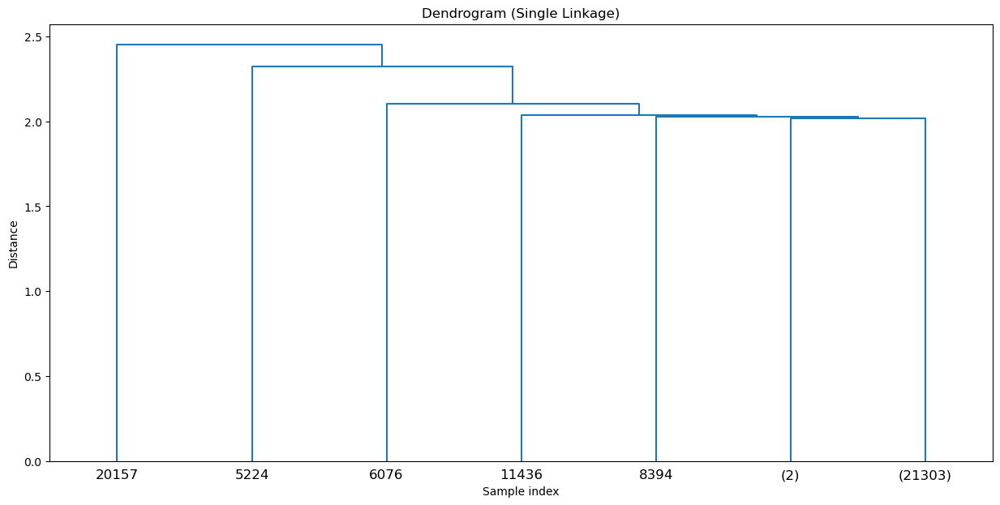

In [128]:
#creating the dendrogram with single linkage, considering the trimmed data frame
Z_single = linkage(X_scaled_trimmed, method='single', metric='euclidean')
plt.figure(figsize=(15, 7))
dendrogram(Z_single, truncate_mode='level', p=5)
plt.title('Dendrogram (Single Linkage)')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

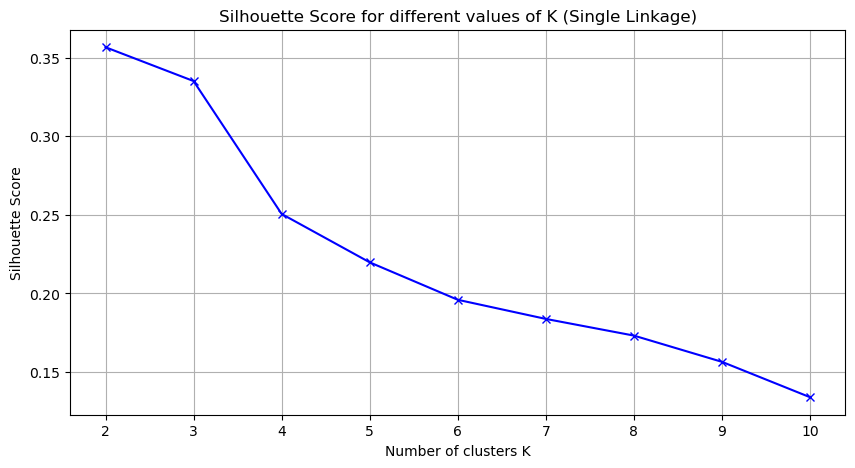

In [129]:
#silhouette analysis for single linkage
silhouette_scores_single = []
K_single = range(2, 11)
for k in K_single:
    labels = fcluster(Z_single, k, criterion='maxclust')
    score = silhouette_score(X_scaled_trimmed, labels)
    silhouette_scores_single.append((k, score))
plt.figure(figsize=(10, 5))
plt.plot([k for k, s in silhouette_scores_single],
         [s for k, s in silhouette_scores_single], 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Single Linkage)')
plt.grid(True)
plt.show()

In [130]:
import pandas as pd
from scipy.cluster.hierarchy import fcluster

results = []

for k in range(2, 9):
    labels = fcluster(Z_single, k, criterion="maxclust")
    sizes = pd.Series(labels).value_counts().sort_values(ascending=False)

    results.append({
        "k": k,
        "min_cluster_size": sizes.min(),
        "max_cluster_size": sizes.max(),
        "n_clusters": sizes.shape[0],
        "cluster_sizes": sizes.values
    })

# Riassunto leggibile
summary = pd.DataFrame({
    "k": [r["k"] for r in results],
    "Smallest cluster": [r["min_cluster_size"] for r in results],
    "Largest cluster": [r["max_cluster_size"] for r in results],
})

summary
for r in results:
    print(f"\nk = {r['k']}")
    print("Cluster sizes:", r["cluster_sizes"])




k = 2
Cluster sizes: [21309     1]

k = 3
Cluster sizes: [21308     1     1]

k = 4
Cluster sizes: [21307     1     1     1]

k = 5
Cluster sizes: [21306     1     1     1     1]

k = 6
Cluster sizes: [21305     1     1     1     1     1]

k = 7
Cluster sizes: [21303     2     1     1     1     1     1]

k = 8
Cluster sizes: [21302     2     1     1     1     1     1     1]


## Average Linkage

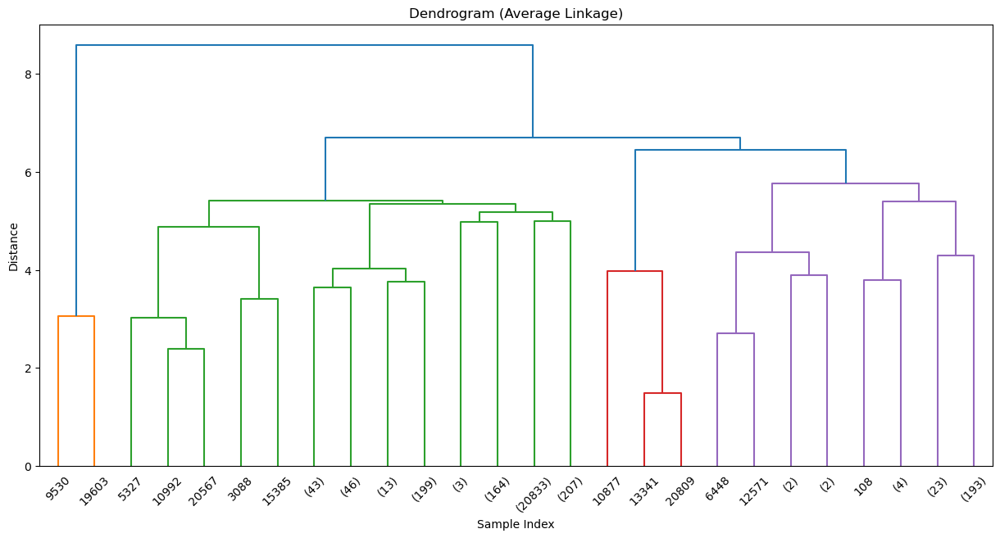

In [131]:
# === Average Linkage clustering === with trimmed data frame
Z_average = linkage(X_scaled, method='average')
 
 # === Plot the dendrogram ===
plt.figure(figsize=(15, 7))
dendrogram(
    Z_average,
    truncate_mode='level',
    p=5
)
plt.title("Dendrogram (Average Linkage)")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

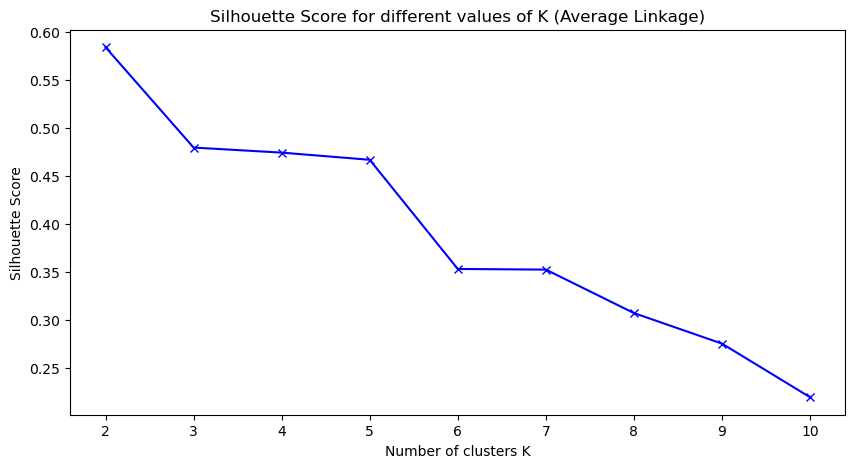

In [132]:
#silhouette analysis for average linkage
silhouette_scores_average = []
K = range(2, 11)
for k in K:
    cluster_labels_average = fcluster(Z_average, k, criterion='maxclust')
    score_average = silhouette_score(X_filtered, cluster_labels_average)
    silhouette_scores_average.append(score_average)
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores_average, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Average Linkage)')
plt.show() 


In [133]:
#counting how many points in each cluster for average linkage with k from 2 to 10
from scipy.cluster.hierarchy import fcluster
for k in range(2, 11):
    cluster_labels_avg = fcluster(Z_average, k, criterion='maxclust')
    cluster_counts = pd.Series(cluster_labels_avg).value_counts().sort_index()
    print(f"\nk = {k} -> Cluster sizes:\n{cluster_counts.values}")



k = 2 -> Cluster sizes:
[    2 21743]

k = 3 -> Cluster sizes:
[    2 21513   230]

k = 4 -> Cluster sizes:
[    2 21513     3   227]

k = 5 -> Cluster sizes:
[    2 21513     3     6   221]

k = 6 -> Cluster sizes:
[    2     5 21508     3     6   221]

k = 7 -> Cluster sizes:
[    2     5 21508     3     6     5   216]

k = 8 -> Cluster sizes:
[    2     5   301 21207     3     6     5   216]

k = 9 -> Cluster sizes:
[    2     5   301   167 21040     3     6     5   216]

k = 10 -> Cluster sizes:
[    2     5   301   167 20833   207     3     6     5   216]


## Experiment with Jaccard distance for Binary Variables

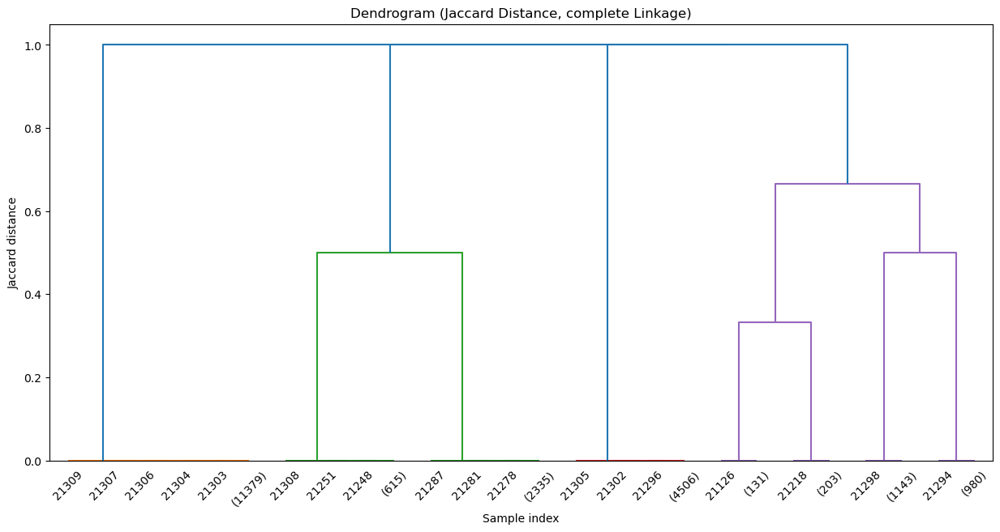

In [134]:
import numpy as np
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# dati binari
binary_data = df_bin_cat_trimmed[binary_cols].astype(int).values

# distanza di Jaccard
jaccard_dist = pdist(binary_data, metric="jaccard")

# linkage compatibile con Jaccard
Z_jaccard = linkage(jaccard_dist, method="complete")

# dendrogramma
plt.figure(figsize=(15, 7))
dendrogram(Z_jaccard, truncate_mode="level", p=5)
plt.title("Dendrogram (Jaccard Distance, complete Linkage)")
plt.xlabel("Sample index")
plt.ylabel("Jaccard distance")
plt.show()




In [135]:
from sklearn.metrics import pairwise_distances

# matrice Jaccard
D_jaccard = pairwise_distances(binary_data, metric="jaccard")

# labels dei cluster euclidei (es. Complete k=2)
labels = df_trimmed["Cluster"].values

within = []
between = []

n = len(labels)
for i in range(n):
    for j in range(i + 1, n):
        if labels[i] == labels[j]:
            within.append(D_jaccard[i, j])
        else:
            between.append(D_jaccard[i, j])

print(f"Mean Jaccard distance (within clusters):  {np.mean(within):.3f}")
print(f"Mean Jaccard distance (between clusters): {np.mean(between):.3f}")


/opt/anaconda3/lib/python3.13/site-packages/sklearn/metrics/pairwise.py:2466: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Mean Jaccard distance (within clusters):  0.595
Mean Jaccard distance (between clusters): 0.662
